In [46]:
from keras import layers , models
import numpy as np
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator , load_img, array_to_img , img_to_array
#from tensorflow import layers
import matplotlib.pylab as plt


In [47]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS = 3
EPOCHS = 5

In [48]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    shuffle = True,
    image_size =(IMAGE_SIZE , IMAGE_SIZE),
    batch_size =BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [49]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

(32, 256, 256, 3)
[1 0 0 0 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0 1 1]


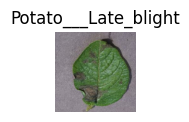

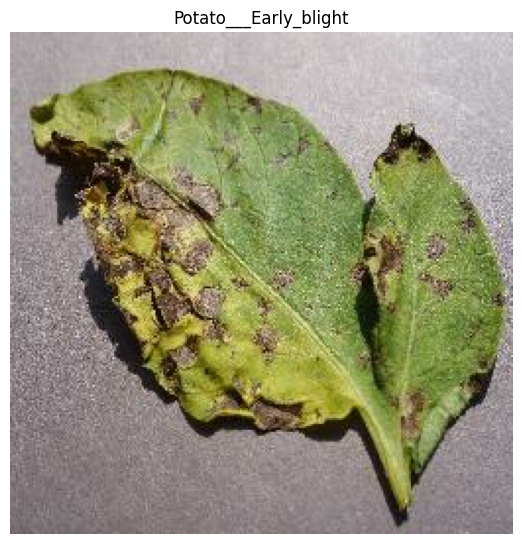

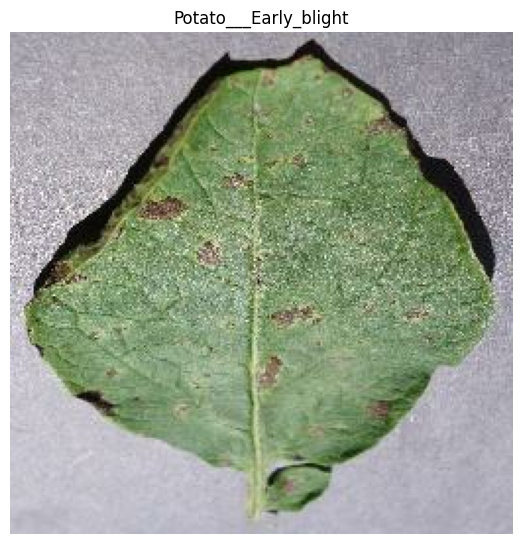

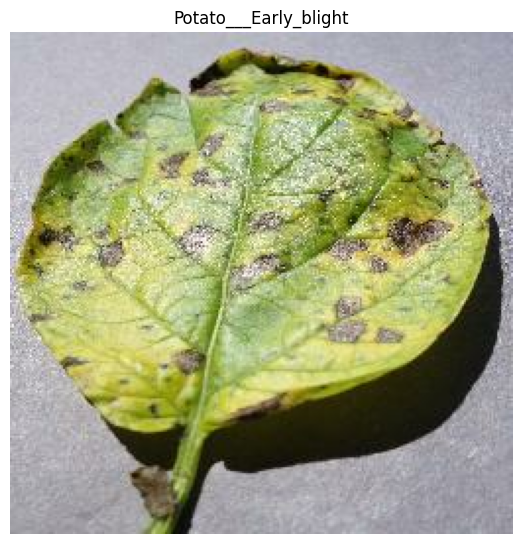

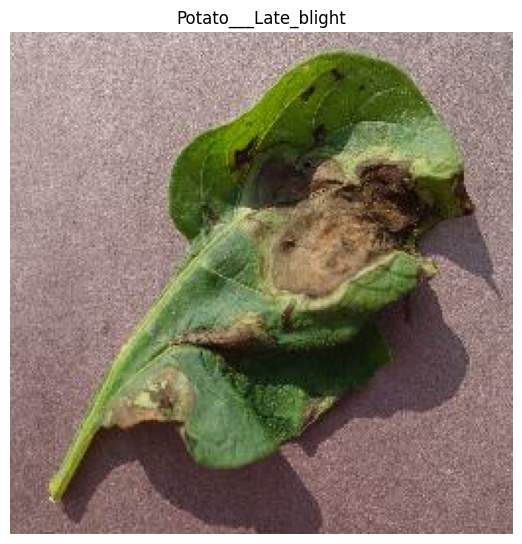

...

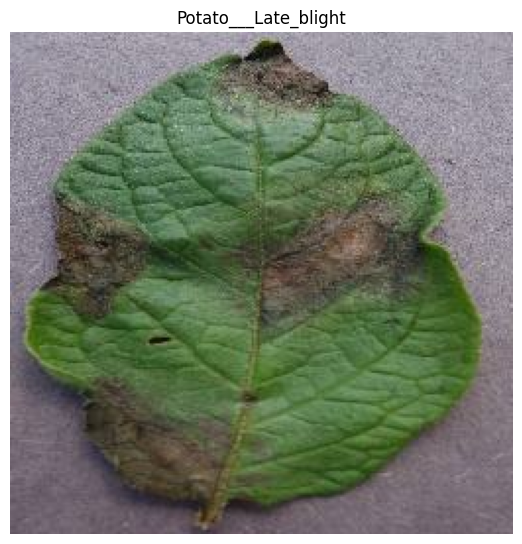

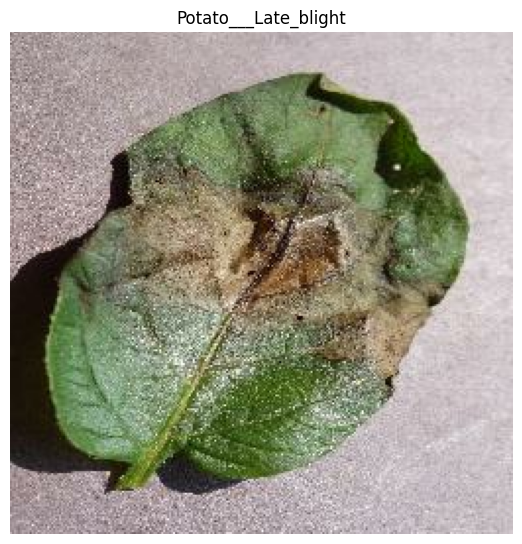

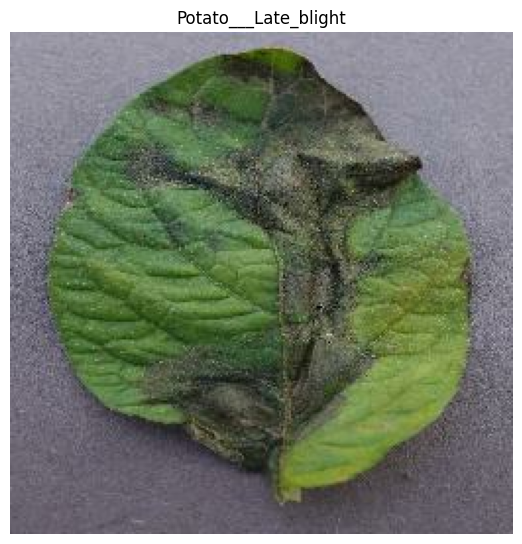

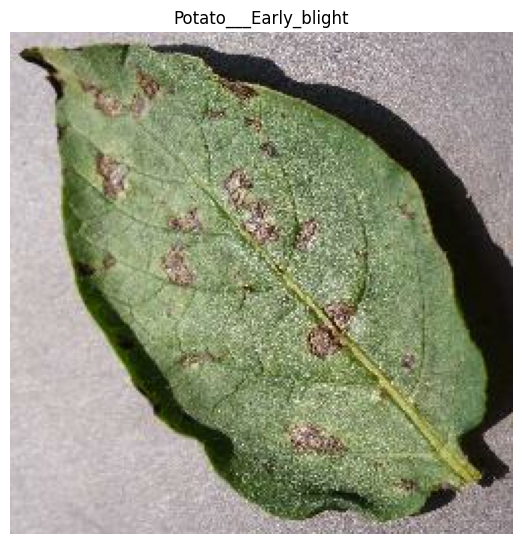

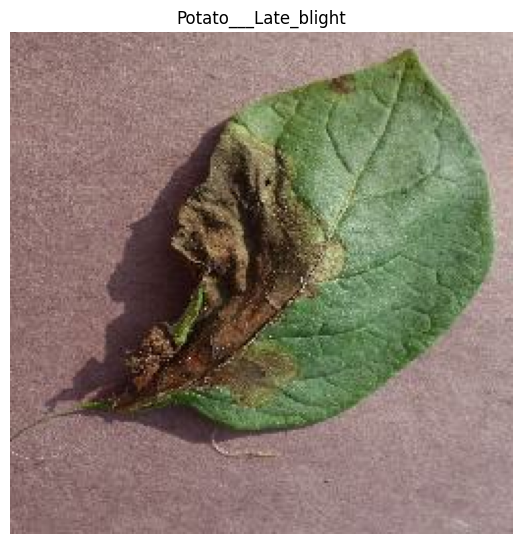

<Figure size 3000x3000 with 0 Axes>

In [50]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())
    for i in range(16):
        ax = plt.subplot(4,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")
        plt.figure(figsize = (30,30))


In [51]:
#80% ==> Traning
#20% ==> test
#   10% ==> Validation
 ##  10% ==> Test

In [52]:
train_size = 0.8
len(dataset)*train_size
#80% part is using  for traning from 68

54.400000000000006

In [53]:
train_ds = dataset.take(54)
len(train_ds)
#take 54 imaage from 68 picture dataset

54

In [54]:
test_ds = dataset.skip(54)
len(test_ds)
#left 14 image from 68 image

14

In [55]:
val_ds = test_ds.take(6)
len(val_ds)
#take 7 image from 14 image validation 

6

In [56]:
test_ds = test_ds.skip(6)
len(test_ds)
#7 image is left for testing 

8

In [57]:
val_size=0.1
len(dataset)*val_size


6.800000000000001

In [58]:
def get_dataset_partition_tf(ds , train_split = 0.8 , val_splite =0.1 , test_splite = 0.1, shuffle = True, shuffle_size = 1000):
    assert(train_ds + test_ds + val_splite) == 1

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed =12)

    train_size = int(train_split*ds_size)
    val_size = int(val_splite*ds_size)


    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds , test_ds


In [59]:

def get_dataset_partition_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=1000):
    assert train_split + val_split + test_split == 1  # Ensure that the splits sum to 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(buffer_size=shuffle_size)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    test_size = int(test_split * ds_size)
    
    train_ds = ds.take(train_size)
    remaining_ds = ds.skip(train_size)
    val_ds = remaining_ds.take(val_size)
    test_ds = remaining_ds.skip(val_size)
    
    return train_ds, val_ds, test_ds

In [60]:
train_ds , val_ds, test_ds = get_dataset_partition_tf(dataset)

In [61]:
len(test_ds)

8

In [62]:
len(val_ds)

6

In [63]:
len(train_ds)

54

In [64]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)


In [65]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].numpy()/255)#.shape)

[[[0.40784314 0.36078432 0.4       ]
  [0.4862745  0.4392157  0.47843137]
  [0.4        0.3529412  0.39215687]
  ...
  [0.68235296 0.65882355 0.69803923]
  [0.6862745  0.6627451  0.7019608 ]
  [0.6901961  0.6666667  0.7058824 ]]

 [[0.42745098 0.38039216 0.41960785]
  [0.46666667 0.41960785 0.45882353]
  [0.38431373 0.3372549  0.3764706 ]
  ...
  [0.67058825 0.64705884 0.6862745 ]
  [0.6745098  0.6509804  0.6901961 ]
  [0.6784314  0.654902   0.69411767]]

 [[0.46666667 0.41960785 0.45882353]
  [0.45490196 0.40784314 0.44705883]
  [0.40784314 0.36078432 0.4       ]
  ...
  [0.67058825 0.64705884 0.6862745 ]
  [0.67058825 0.64705884 0.6862745 ]
  [0.6745098  0.6509804  0.6901961 ]]

 ...

 [[0.40784314 0.3764706  0.45882353]
  [0.40784314 0.3764706  0.45882353]
  [0.41960785 0.3882353  0.47058824]
  ...
  [0.654902   0.65882355 0.7372549 ]
  [0.654902   0.65882355 0.7372549 ]
  [0.6509804  0.654902   0.73333335]]

 [[0.4392157  0.40784314 0.49019608]
  [0.44313726 0.4117647  0.49411765]


In [66]:
Resizing_and_Rescsling = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [67]:
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal"),
    layers.experimental.preprocessing.RandomFlip("vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2),
    layers.experimental.preprocessing.RandomContrast(0.5)
])

In [68]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an instance of ImageDataGenerator and use it to augment your images
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [69]:
input_size = (BATCH_SIZE , IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
n_classes = 3
model = tf.keras.Sequential([
    # Resizing_and_Rescsling,
    # data_augmentation,
    layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax')
])
model.build(input_shape=input_size)

In [70]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (32, 127, 127, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (32, 62, 62, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (32, 60, 60, 64)          36928     
                                                                 
 max_pooling2d_6 (MaxPoolin  (32, 30, 30, 64)         

In [71]:
model.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=["accuracy"]
)


In [72]:
history =model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS
)

Epoch 1/5


54/54 [==============================] - 57s 991ms/step - loss: 7.7335 - accuracy: 0.6725 - val_loss: 0.3669 - val_accuracy: 0.8802
Epoch 2/5
54/54 [==============================] - 51s 941ms/step - loss: 0.4032 - accuracy: 0.8492 - val_loss: 0.3815 - val_accuracy: 0.8333
Epoch 3/5
54/54 [==============================] - 47s 874ms/step - loss: 0.3395 - accuracy: 0.8668 - val_loss: 0.1684 - val_accuracy: 0.9375
Epoch 4/5
54/54 [==============================] - 47s 875ms/step - loss: 0.2350 - accuracy: 0.9114 - val_loss: 0.1403 - val_accuracy: 0.9479
Epoch 5/5
54/54 [==============================] - 48s 883ms/step - loss: 0.1857 - accuracy: 0.9302 - val_loss: 0.1484 - val_accuracy: 0.9479


In [73]:
model.evaluate(test_ds)

8/8 [==============================] - 3s 202ms/step - loss: 0.2524 - accuracy: 0.9310


[0.2523874342441559, 0.931034505367279]

In [74]:
history.params


{'verbose': 1, 'epochs': 5, 'steps': 54}

In [75]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [76]:
history.history['val_accuracy']


[0.8802083134651184,
 0.8333333134651184,
 0.9375,
 0.9479166865348816,
 0.9479166865348816]

In [77]:
len(history.history['accuracy'])

5

In [78]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

In [79]:
history.history['accuracy']

[0.672535240650177,
 0.8491784334182739,
 0.8667840361595154,
 0.9113849997520447,
 0.9301643371582031]

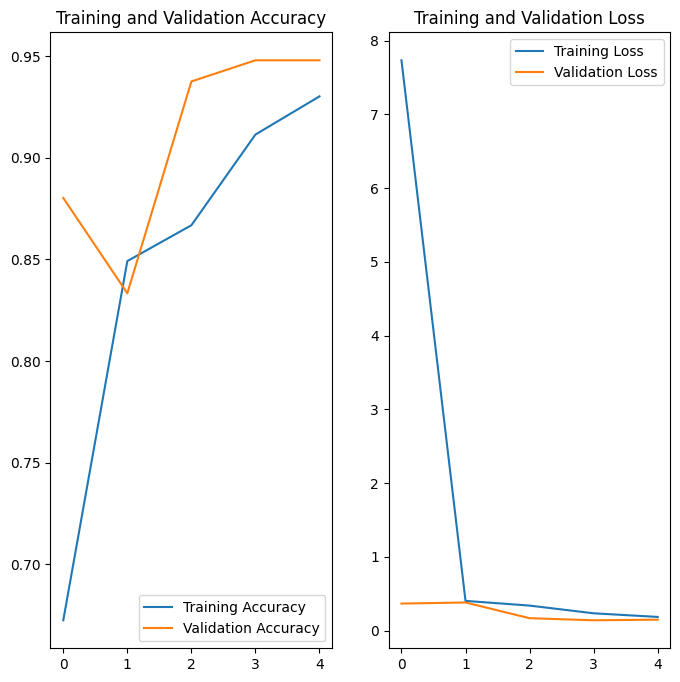

In [80]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')  # Corrected 'Lower right' to 'lower right'
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()




Frist image to print
label :  Potato___Late_blight
1/1 [==============================] - 0s 217ms/step
Predicting label  Potato___Late_blight


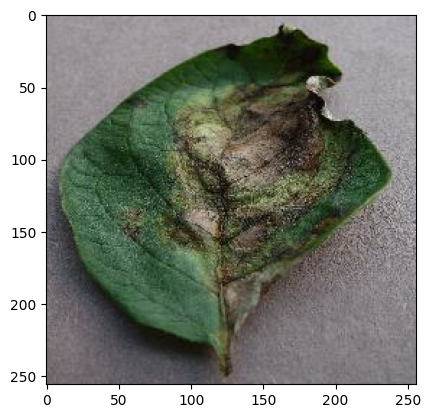

In [81]:
for image_batch , labels_batch  in test_ds.take(1):
    frist_image = image_batch[0].numpy().astype('uint8')
    
    print('Frist image to print')

    plt.imshow(frist_image)
    
    print('label : ', class_names[labels_batch[0].numpy()])

    batch_predicting = model.predict(image_batch)
    print("Predicting label ", class_names[np.argmax(batch_predicting[0])])

In [82]:
def predict(model , img):
    img_array = tf.keras.preprocessing,img_to_array(img[i].np())
    img_array = tf.expand_dims(img_array, 0)#create a batch

    predections = model.predict(img_array)

    predicted_class = class_names[np.argmax(predections[0])]
    confidence = round(100 *(np.max(predections[0])), 2)
    return predicted_class ,confidence

In [83]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  # Create a batch
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = 100 * np.max(predictions)
    return predicted_class, confidence

1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 24ms/step


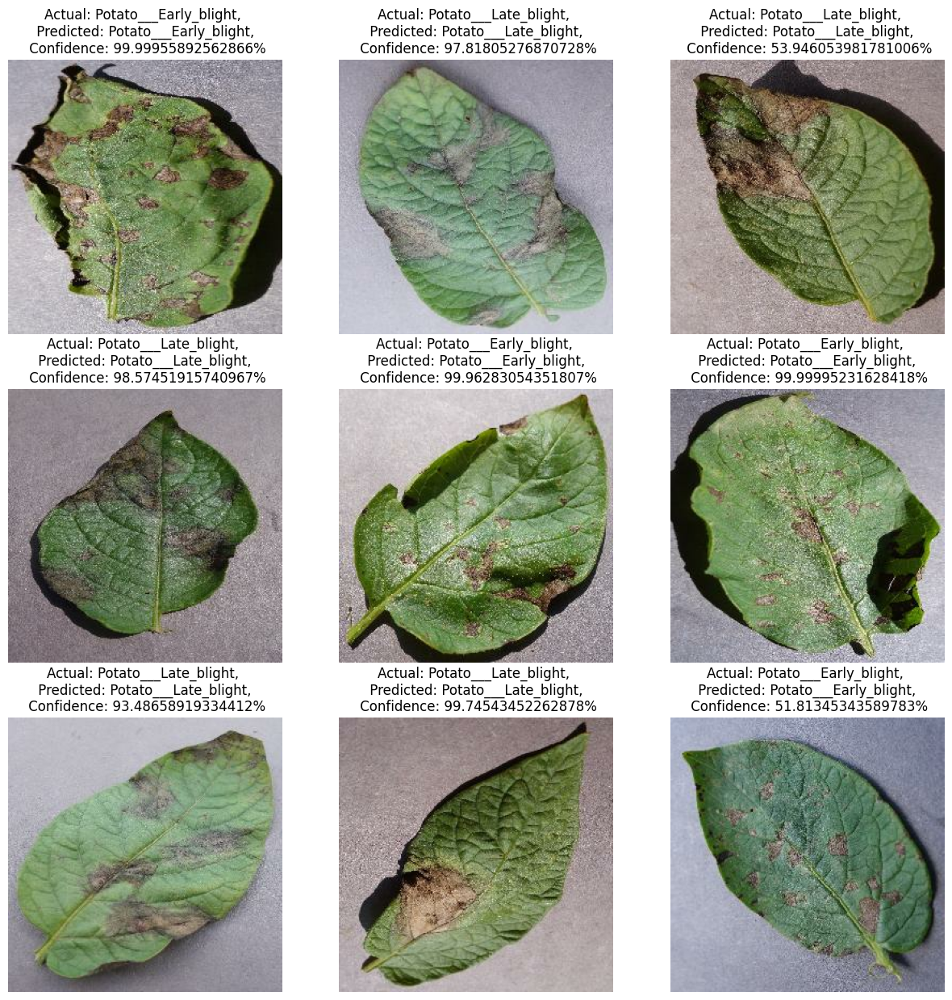

In [84]:
plt.figure(figsize =(15,15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3 , i +1)
        plt.imshow(images[i].numpy().astype('uint8'))
        predicted_class , confidence = predict(model ,images[i].numpy())

        actule_class = class_names[labels[i]]
        plt.title(f"Actual: {actule_class}, \n Predicted: { predicted_class}, \n Confidence: {confidence}%")

        plt.axis('off')


In [85]:
import os
model_version = max({int(i) for I in os.listdir("C:\\Users\ARYAN\\Desktop\\patato_project\\patato_project") + [0]})+1

In [86]:
model_version = 2
model.save(f"C:\\Users\\ARYAN\\Desktop\\patato_project\\patato_project\\Model {model_version}")

INFO:tensorflow:Assets written to: C:\Users\ARYAN\Desktop\patato_project\patato_project\Model 2\assets


INFO:tensorflow:Assets written to: C:\Users\ARYAN\Desktop\patato_project\patato_project\Model 2\assets


In [87]:
model.save("C:\\Users\\ARYAN\\Desktop\\patato_project\\patato_project\\mymodel.h5")

c:\Users\ARYAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [90]:
from keras.preprocessing.image import load_img, img_to_array
test_image_path = r"C:\Users\ARYAN\Desktop\patato_project\patato_project\00b1f292-23dd-44d4-aad3-c1ffb6a6ad5a___RS_LB 4479.JPG"
img = load_img(test_image_path , target_size=(256,256))
img_array = img_to_array(img)
img_array = img_array.reshape((1,256,256,3))

prediction = model.predict(img_array)
predicted_class = class_names[np.argmax(prediction[0])]
confidence = 100* np.max(prediction)

print(f"Predicted class: {predicted_class}, confidence: {confidence}")

1/1 [==============================] - 0s 33ms/step
Predicted class: Potato___Late_blight, confidence: 99.93047714233398


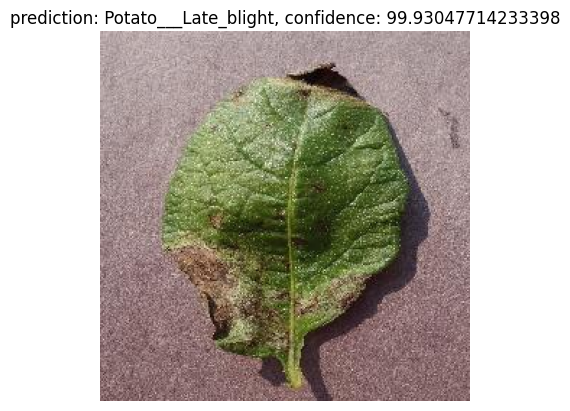

In [91]:
img = load_img(test_image_path , target_size=(256,256))
img_array = img_to_array(img)

plt.imshow(img_array.astype('uint8'))
plt.title(f"prediction: {predicted_class}, confidence: {confidence}")
plt.axis("off")
plt.show()